In [47]:
import omnipath as op
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pySankey import sankey as sn
import mellon as ml
import networkx as nx
from matplotlib.pyplot import figure
import glob
import netrd
import itertools


Source hits:  111
% of source hits in total genes of interest:  4.431137724550898
Target hits:  266
% of target hits in total genes of interest:  10.6187624750499
MAPK3    82.0
MAPK1    75.0
STAT3    66.0
CXCR4    51.0
CCR4     46.0
         ... 
IMPG2     0.0
IFNK      0.0
IL12A     0.0
IL12B     0.0
ZPBP2     0.0
Length: 353, dtype: float64


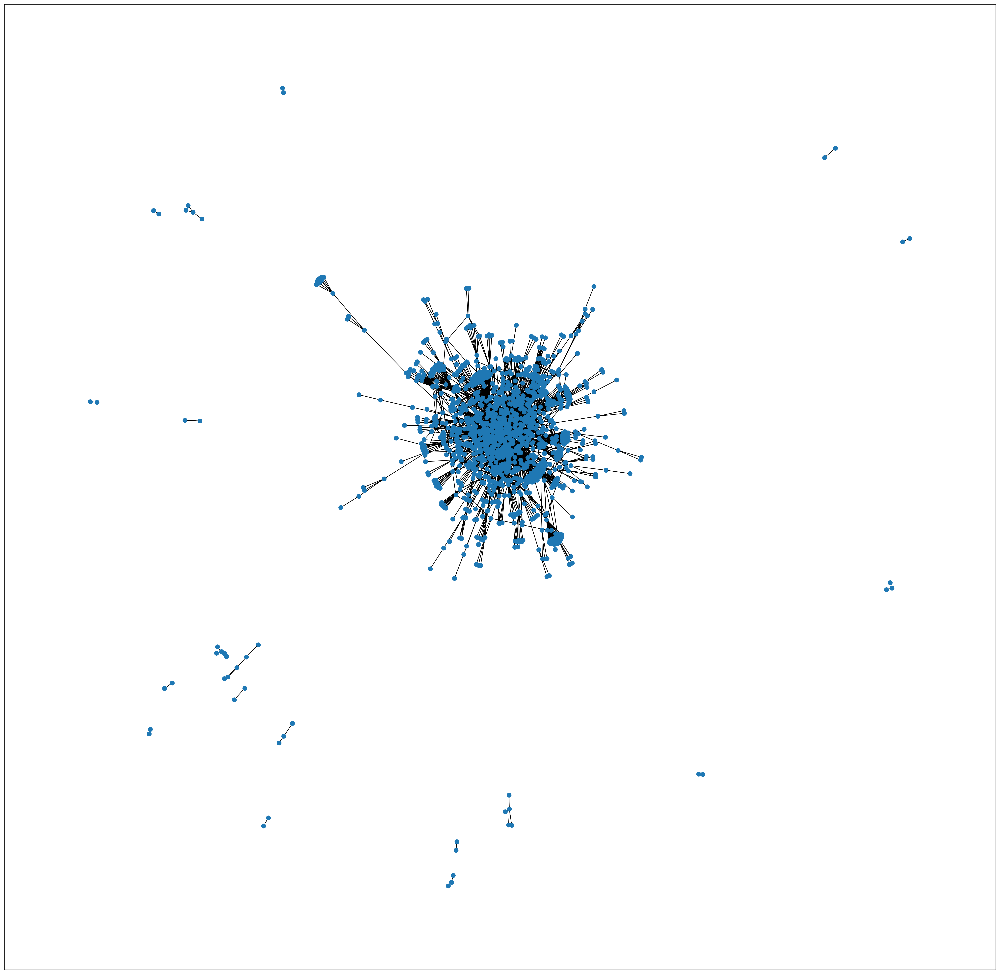

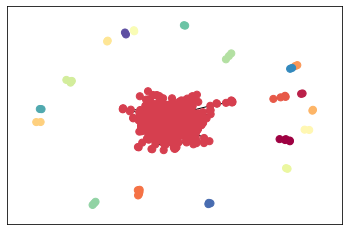

0.9615952732644018
Source hits:  83
% of source hits in total genes of interest:  4.657687991021325
Target hits:  219
% of target hits in total genes of interest:  12.289562289562289
MAPK3    82.0
MAPK1    75.0
STAT3    66.0
CXCR4    51.0
CCR4     46.0
         ... 
NID1      0.0
NLGN1     0.0
MAPT      0.0
MICA      0.0
MICB      0.0
Length: 282, dtype: float64


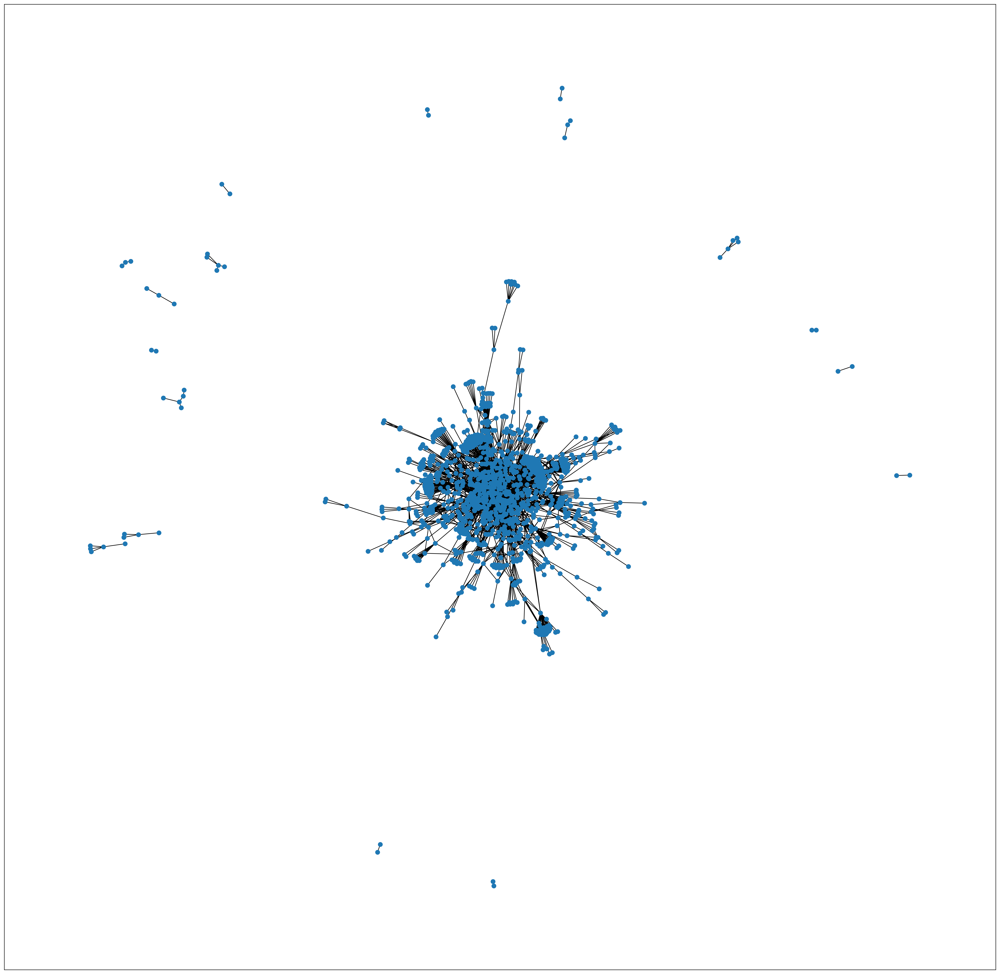

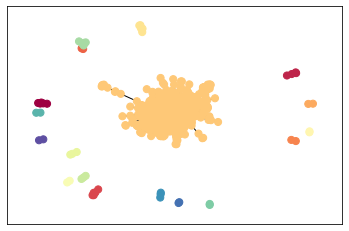

0.9588377723970944
Source hits:  62
% of source hits in total genes of interest:  4.592592592592593
Target hits:  184
% of target hits in total genes of interest:  13.62962962962963
MAPK3    82.0
MAPK1    75.0
STAT3    66.0
CXCR4    51.0
CCR4     46.0
         ... 
ETV5      0.0
LGI1      0.0
MICB      0.0
MAPT      0.0
EFNA5     0.0
Length: 232, dtype: float64


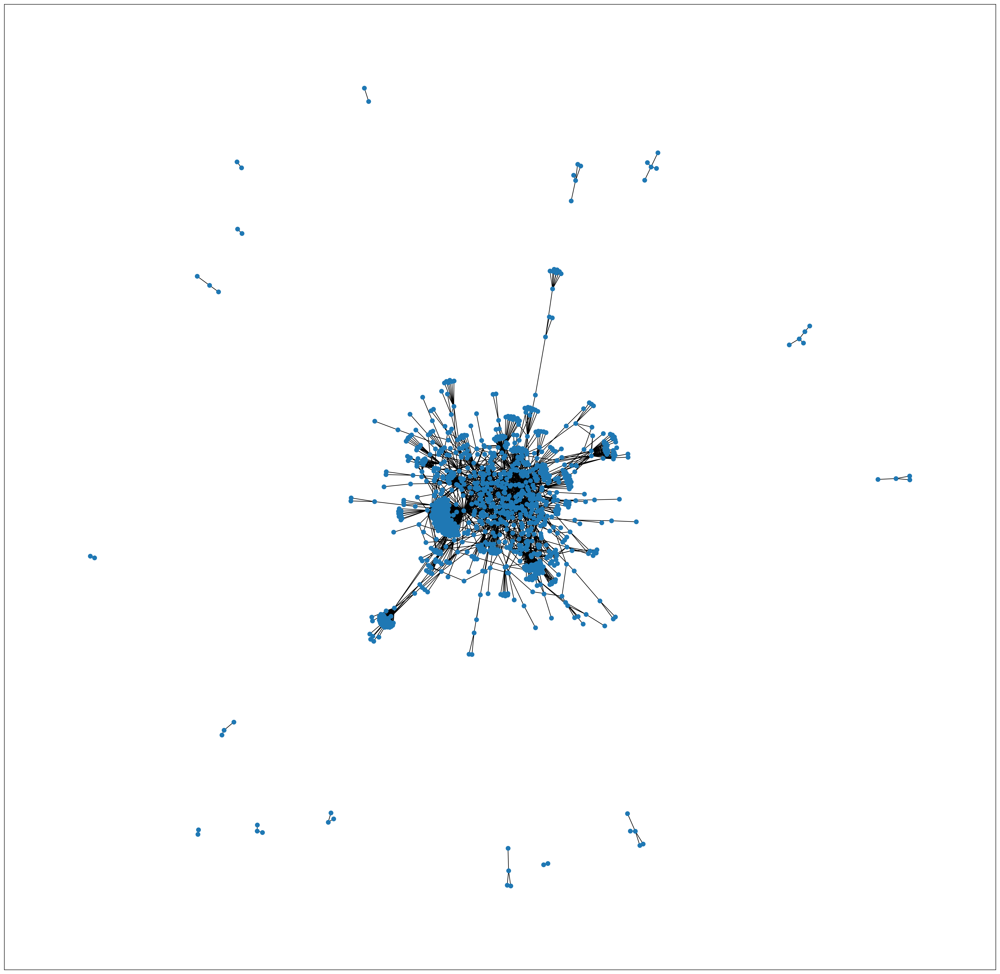

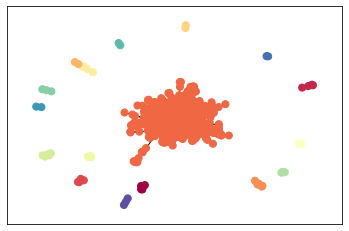

0.9517625231910947
Source hits:  51
% of source hits in total genes of interest:  5.214723926380368
Target hits:  138
% of target hits in total genes of interest:  14.11042944785276
STAT3    66.0
CXCR4    51.0
ITGB5    34.0
ITGA9    30.0
ITGA8    25.0
         ... 
FGF20     0.0
FGF6      0.0
FSTL5     0.0
GAL       0.0
IL12A     0.0
Length: 176, dtype: float64


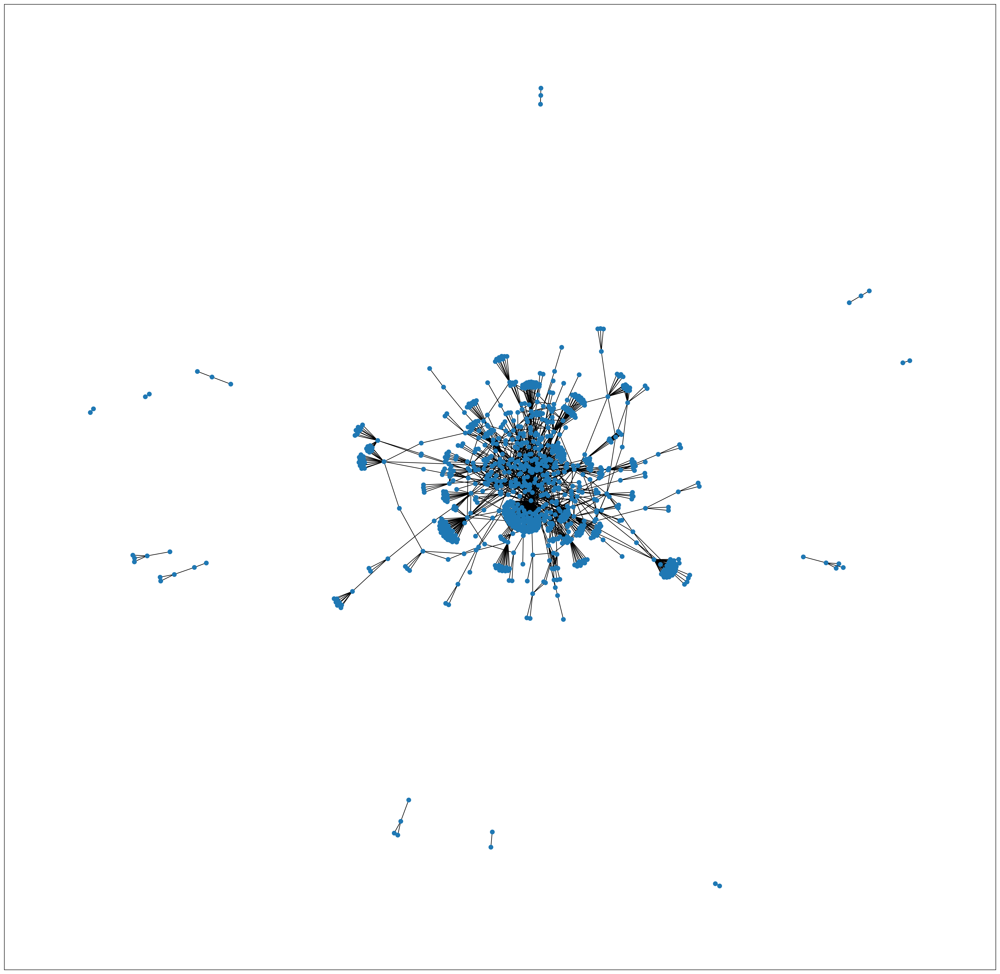

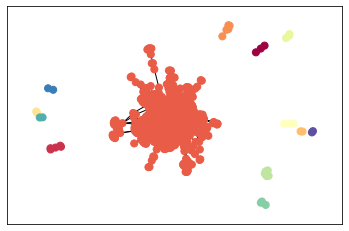

0.9594882729211087
Source hits:  30
% of source hits in total genes of interest:  4.975124378109453
Target hits:  87
% of target hits in total genes of interest:  14.427860696517413
STAT3    66.0
ITGB5    34.0
ITGA8    25.0
TLR4     19.0
NRP1     19.0
         ... 
FGF20     0.0
CRH       0.0
MAPT      0.0
ETV5      0.0
EFNA5     0.0
Length: 111, dtype: float64


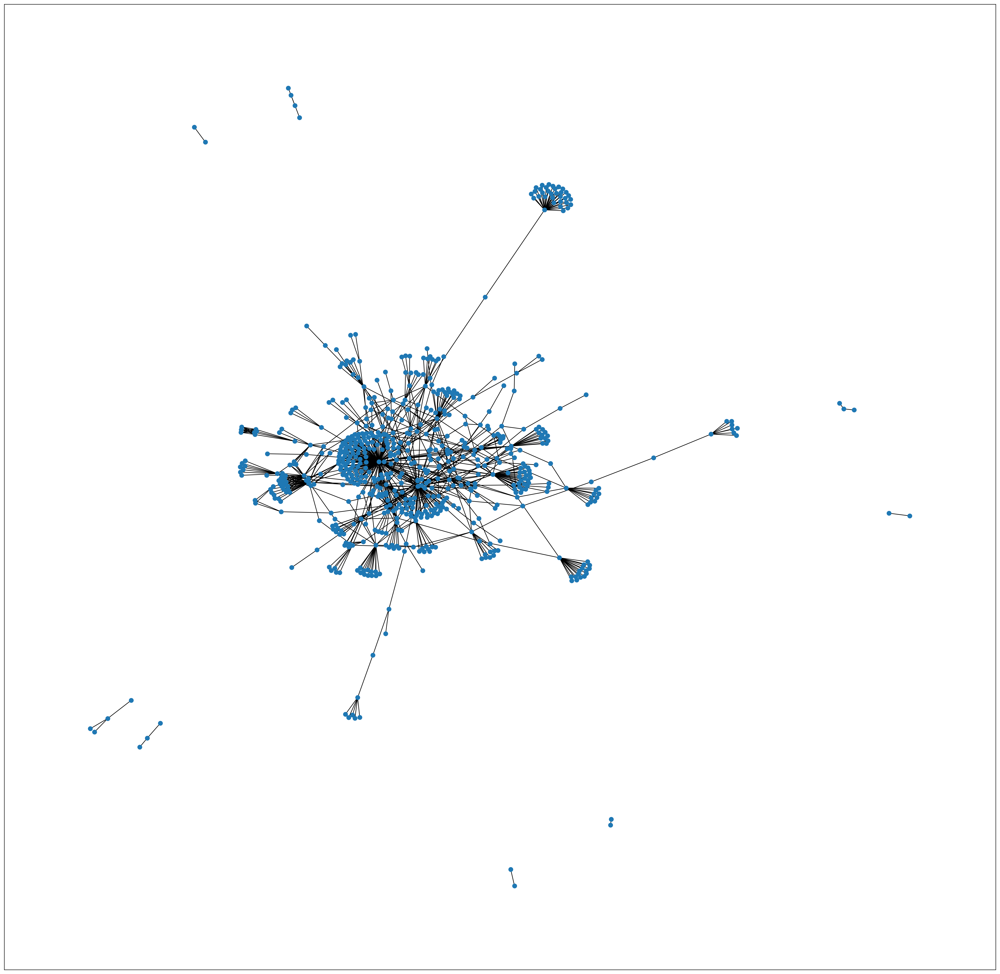

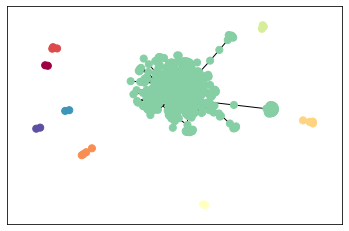

0.967551622418879
Source hits:  17
% of source hits in total genes of interest:  4.9853372434017595
Target hits:  55
% of target hits in total genes of interest:  16.129032258064516
ITGB5     34.0
TLR4      19.0
ERBB4     14.0
APP       11.0
NOTCH3    10.0
          ... 
FSTL5      0.0
LGI1       0.0
IL12A      0.0
LRFN5      0.0
MAPT       0.0
Length: 70, dtype: float64


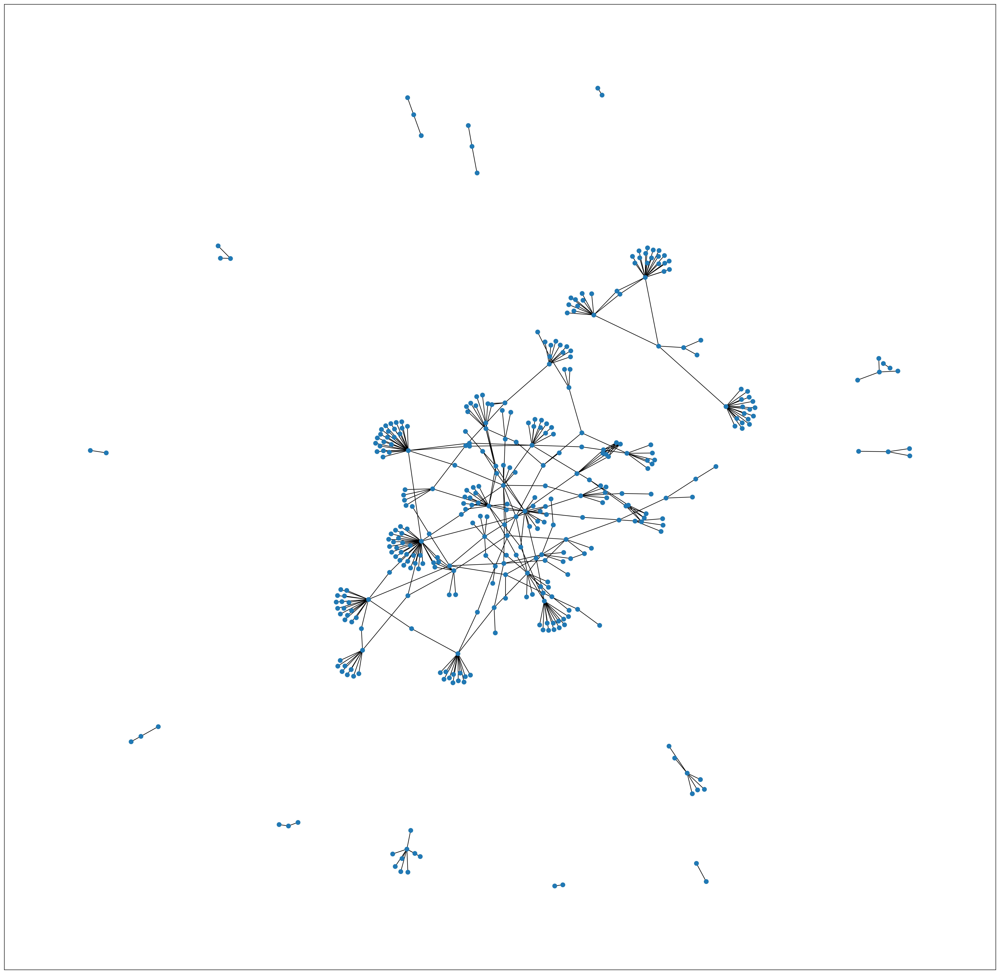

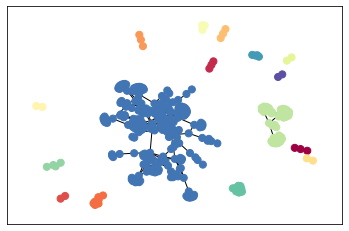

0.7347480106100795
Source hits:  10
% of source hits in total genes of interest:  5.208333333333334
Target hits:  30
% of target hits in total genes of interest:  15.625
TLR4       19.0
APP        11.0
NOTCH3     10.0
PRKD1      10.0
DCC         8.0
GRIA1       7.0
SCN9A       5.0
ATM         5.0
GRIN2A      4.0
PLA2G6      4.0
SCN1A       4.0
SCN2A       4.0
CR1         2.0
CHRNB2      2.0
ESR2        2.0
ACE         2.0
STK39       2.0
TBK1        2.0
NEGR1       2.0
VRK2        1.0
UNC5C       1.0
TUBA4A      1.0
RTN4R       1.0
PSEN1       1.0
CILK1       1.0
ATP2A2      1.0
GRM5        1.0
CNTNAP2     1.0
ADCY2       1.0
AKT3        1.0
RELN        0.0
APOE        0.0
CNTN4       0.0
SORL1       0.0
ANG         0.0
SNCA        0.0
GAL         0.0
LRFN5       0.0
LGI1        0.0
MAPT        0.0
dtype: float64


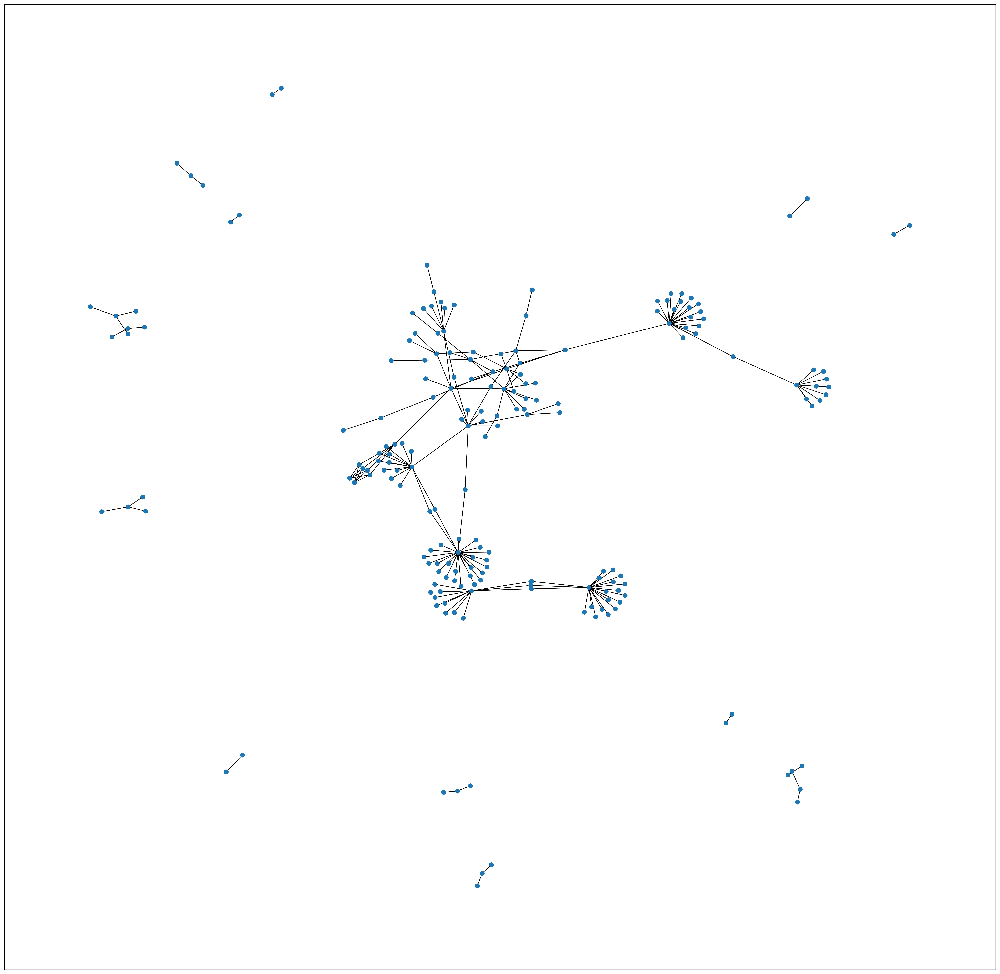

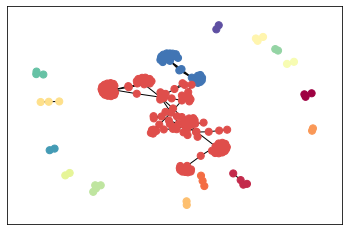

0.6548223350253807


In [50]:
path = glob.glob("processed_data/hot-encoded-diseases_*.csv")

comparison = pd.DataFrame(np.zeros(shape=(7,5)), index = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7], columns = ['number of LRs', 'number of diseases', '% ligands', '% receptors', '% genes in major network'])

for res in range(0,len(path)):
    db = op.interactions.import_intercell_network(transmitter_params = {"categories":"ligand"}, receiver_params = {"categories": "receptor"})
    db = db[np.logical_not(db['genesymbol_intercell_source'].str.startswith('HLA'))]
    tgts_all = pd.read_csv(path[res])
    tgts_all['gene']=tgts_all['genes']
    tgts = tgts_all.drop(columns=['genes']).set_index(['gene'])

    source, percSrc, targets, percTgt, sum = ml.lr.find_hits(tgts, db)
    
    comparison['number of diseases'].iloc[res] = len(tgts.columns)
    comparison['% ligands'].iloc[res] = percSrc
    comparison['% receptors'].iloc[res] = percTgt

    LRs = db[['genesymbol_intercell_source','genesymbol_intercell_target']][(db['genesymbol_intercell_source'].isin(list(sum.gene))) | (db['genesymbol_intercell_target'].isin(list(sum.gene)))]
    unique_genes = np.unique(list(LRs['genesymbol_intercell_source'])+list(LRs['genesymbol_intercell_target']))

    comparison['number of LRs'].iloc[res] = len(unique_genes)

    # Adjacency matrix with entire network across all diseases
    adj_LRs = pd.DataFrame(np.zeros(shape=(len(unique_genes), len(unique_genes))), index = unique_genes, columns = unique_genes)

    for n in range (0, np.shape(LRs)[0]):
        adj_LRs.iloc[adj_LRs.index.get_loc(LRs.iloc[n]['genesymbol_intercell_source']), adj_LRs.columns.get_loc(LRs.iloc[n]['genesymbol_intercell_target'])] += 1

    #Number of cell-cell interactions ligands of interest are involved in
    print(adj_LRs.sum(axis = 0).sort_values(ascending=False)[adj_LRs.sum(axis = 0).sort_values(ascending=False).index.isin(list(tgts.index))])

    #Number of cell-cell interactions receptors of interest are involved in
    adj_LRs.sum(axis = 1).sort_values(ascending=False)[adj_LRs.sum(axis = 1).sort_values(ascending=False).index.isin(list(tgts.index))]

    # Overview of LR network and calculating rank of importance with PageRank

    H = nx.from_pandas_adjacency(adj_LRs)

    plt.figure(figsize=(30,30), dpi = 300)
    sm = nx.draw_networkx(H, with_labels=False, node_size = 50)
    plt.show()

    comms = ml.network.louvain_communities(H, seed = 123, resolution = 0.01)

    colours = []
    for i in H.nodes:
        for m in range(0,len(comms)):
            if i in comms[m]:
                colours.append(m)
    len(colours)

    #from matplotlib.pyplot import figure
    #figure(figsize=(15, 15), dpi=80)


    nx.draw_networkx(H, node_color=colours, vmin=min(colours), vmax=max(colours), cmap=plt.get_cmap("Spectral"), with_labels=False, node_size = 50)
    plt.show()

    for l in range(0,len(comms)):
        this = len(comms[l])
        if (l == 0):
            longest = this
        elif (this > longest):
            longest = this
    comparison['% genes in major network'].iloc[res] = longest/len(H)
    print(longest/len(H))




Text(0.5, 1.0, '% genes in major network')

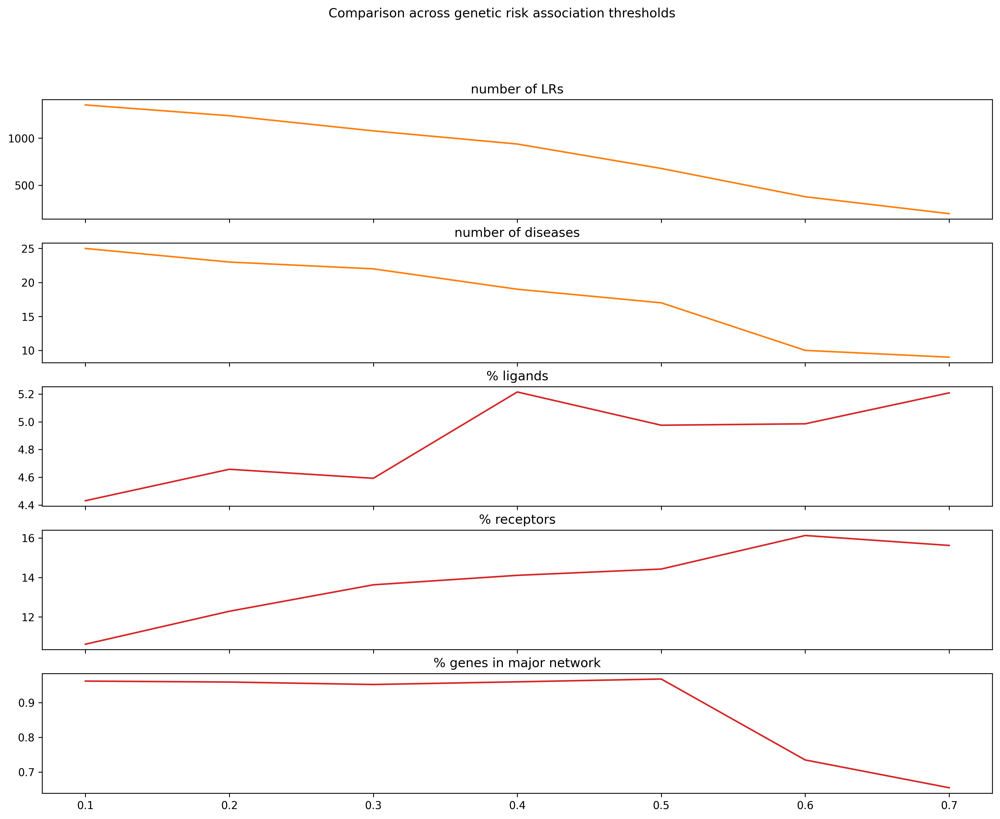

In [51]:
x = list(comparison.index)

fig, axs = plt.subplots(5, sharex=True, sharey=False, figsize=(16,12), dpi = 300)
fig.suptitle('Comparison across genetic risk association thresholds')
axs[0].plot(x, comparison['number of LRs'], 'tab:orange')
axs[0].set_title('number of LRs')
axs[1].plot(x, comparison['number of diseases'], 'tab:orange')
axs[1].set_title('number of diseases')
axs[2].plot(x, comparison['% ligands']*100, 'tab:red')
axs[2].set_title('% ligands')
axs[3].plot(x, comparison['% receptors'], 'tab:red')
axs[3].set_title('% receptors')
axs[4].plot(x, comparison['% genes in major network'], 'tab:red')
axs[4].set_title('% genes in major network')